In [114]:
# !pip install --user -U histolab
import torch
import torch.nn as nn
import torch.nn.functional as F

def check_cuda():
    if torch.cuda.is_available():       
        device = torch.device("cuda")
        print(f'There are {torch.cuda.device_count()} GPU(s) available.')
        print('Device name:', torch.cuda.get_device_name(0))
        return device
    else:
        print('No GPU available, using the CPU instead.')
        device = torch.device("cpu")
        return device
    
check_cuda()

No GPU available, using the CPU instead.


device(type='cpu')

In [2]:
import pandas as pd
import numpy as np

import openslide

In [24]:
df = pd.read_pickle('tokenized_data.pkl')
# df['size'] = df['size'].astype(np.array)
df['h'] = df['size'].apply(lambda x: int(x.split(',')[0][1:]))
df['w'] = df['size'].apply(lambda x: int(x.split(',')[1][:-1]))
df

,paths,patient_id,tissue,cat,notes,maj_tissue,size,tokens,strp_punc,1stword,complete_tokens,h,w
0,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-14DAR-0426,Adipose - Visceral (Omentum),hyperplasia,"2 pieces, ~5% fasca, delineated. Minute focus ...",Adipose,"(55775, 37700)","[pieces, fasca, delineated, Minute, focus, of,...",2 pieces 5 fasca delineated Minute focus of me...,[2],"[2, pieces, fasca, delineated, Minute, focus, ...",55775,37700
1,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-13QBU-0926,Esophagus - Muscularis,clean_specimens,"6 pieces, all muscularis, good specimens",Esophagus,"(71711, 40331)","[pieces, all, muscularis, good, specimens]",6 pieces all muscularis good specimens,[6],"[6, pieces, all, muscularis, good, specimens]",71711,40331
2,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-18QFQ-0326,Muscle - Skeletal,atrophy,2 pieces; skeletal muscle with scant internal ...,Muscle,"(49799, 24496)","[pieces, skeletal, muscle, with, scant, intern...",2 pieces skeletal muscle with scant internal f...,[2],"[2, pieces, skeletal, muscle, with, scant, int...",49799,24496
3,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-139YR-1526,Pancreas,fibrosis,"2 pieces; islets well visualized, focal PanIN-...",Pancreas,"(63743, 37311)","[pieces, islets, well, visualized, focal, PanI...",2 pieces islets well visualized focal PanIN1 s...,[2],"[2, pieces, islets, well, visualized, focal, P...",63743,37311
4,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-R55C-0526,Lung,emphysema,"2 pieces, 10x7 & 8x5 mm; patchy emphysema",Lung,"(39839, 32246)","[pieces, 10x7, 8x5, mm, patchy, emphysema]",2 pieces 10x7 8x5 mm patchy emphysema,[2],"[2, pieces, 10x7, 8x5, mm, patchy, emphysema]",39839,32246
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7723,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-1GTWX-0626,Lung,congestion,"2 pieces, moderate congestion",Lung,"(41831, 26034)","[pieces, moderate, congestion]",2 pieces moderate congestion,[2],"[2, pieces, moderate, congestion]",41831,26034
7724,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-1AX8Z-2226,Stomach,gastritis,6 pieces: 2 without muscularis; chronic gastritis,Stomach,"(51791, 35651)","[pieces, without, muscularis, chronic, gastritis]",6 pieces 2 without muscularis chronic gastritis,[6],"[6, pieces, without, muscularis, chronic, gast...",51791,35651
7725,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-1J8Q3-1526,Adipose - Subcutaneous,fibrosis,2 pieces; <10% fibrous content,Adipose,"(53783, 38942)","[pieces, 10, fibrous, content]",2 pieces 10 fibrous content,[2],"[2, pieces, 10, fibrous, content]",53783,38942
7726,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-UJHI-0126,Spleen,congestion,"2 pieces, 8x7 & 8x7mm; moderate congestion; di...",Spleen,"(45815, 32790)","[pieces, 8x7, 8x7mm, moderate, congestion, dis...",2 pieces 8x7 8x7mm moderate congestion discre...,[2],"[2, pieces, 8x7, 8x7mm, moderate, congestion, ...",45815,32790


In [25]:
def find_level_sizes(slide_path, level=0):
    slide = openslide.open_slide(slide_path)
    return slide.dimensions

In [9]:
# df['size'] = df.paths.apply(find_level_sizes)

# df.to_csv('starting.csv', index=False)

# df

In [17]:
import matplotlib.pyplot as plt

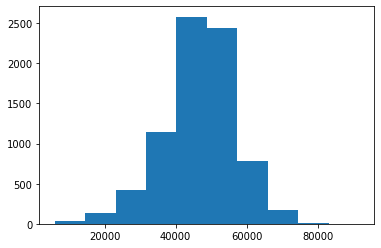

In [26]:
plt.hist([x for x in df['h']])
plt.show()

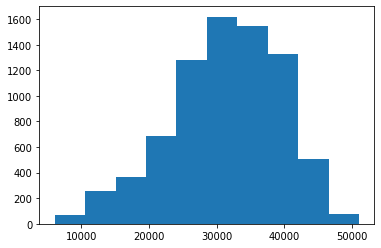

In [27]:
plt.hist([x for x in df['w']])
plt.show()

In [28]:
from histolab.slide import Slide
from histolab.masks import TissueMask,BiggestTissueBoxMask

In [29]:
process_path = '/project/GutIntelligenceLab/ss4yd/gtex_data/process_path/'

In [30]:
slide = Slide(df['paths'][1], processed_path=process_path)

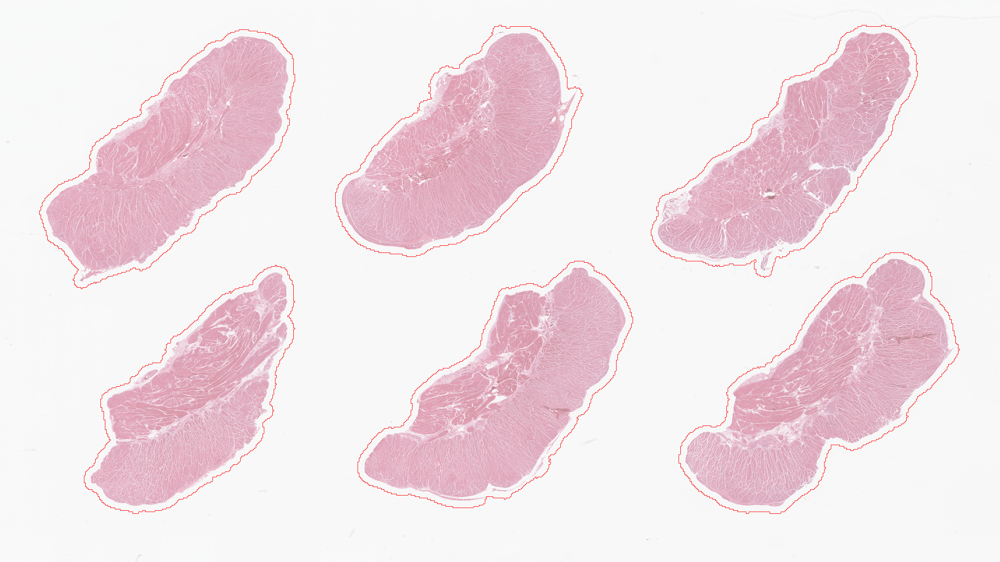

In [31]:
all_tissue_mask = TissueMask()
slide.locate_mask(all_tissue_mask)

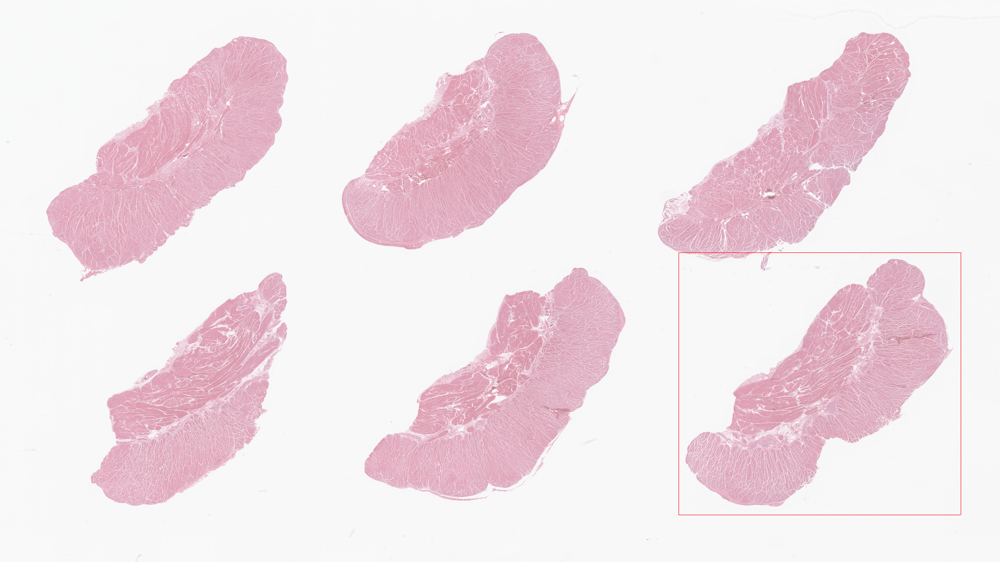

In [32]:
big_tissue_mask = BiggestTissueBoxMask()
slide.locate_mask(big_tissue_mask)

In [34]:
slide.dimensions

(71711, 40331)

In [46]:
mask=BiggestTissueBoxMask()._mask(slide)

In [36]:
# slide.scaled_image().size

In [42]:
slide.level_magnification_factor(2)

'1.25X'

In [43]:
71711/716

100.15502793296089

In [49]:
40311/403

100.0272952853598

In [54]:
from typing import Any, Callable, List, Tuple
from skimage.measure import label, regionprops

from collections import namedtuple

CoordinatePair = namedtuple("CoordinatePair", ("x_ul", "y_ul", "x_br", "y_br"))
Region = namedtuple("Region", ("index", "area", "bbox", "center", "coords"))

def regions_from_binary_mask(binary_mask):
    """Calculate regions properties from a binary mask.
    Parameters
    ----------
    binary_mask : np.ndarray
        Binary mask from which to extract the regions
    Returns
    -------
    List[Region]
        Properties for all the regions present in the binary mask
    """

    def convert_np_coords_to_pil_coords(
        bbox_np: Tuple[int, int, int, int]
    ) -> Tuple[int, int, int, int]:
        return (*reversed(bbox_np[:2]), *reversed(bbox_np[2:]))

    thumb_labeled_regions = label(binary_mask)
    regions = [
        Region(
            index=i,
            area=rp.area,
            bbox=convert_np_coords_to_pil_coords(rp.bbox),
            center=rp.centroid,
            coords=rp.coords,
        )
        for i, rp in enumerate(regionprops(thumb_labeled_regions))
    ]
    return regions

In [93]:
levelbbox=CoordinatePair(*regions_from_binary_mask(mask)[0].bbox)

In [65]:
slide.level_dimensions(2)

(4481, 2520)

In [66]:
def scale_coordinates(
    reference_coords: CoordinatePair,
    reference_size: Tuple[int, int],
    target_size: Tuple[int, int],
) -> CoordinatePair:
    """Compute the coordinates corresponding to a scaled version of the image.
    Parameters
    ----------
    reference_coords: CoordinatePair
        Coordinates referring to the upper left and lower right corners
        respectively.
    reference_size: tuple of int
        Reference (width, height) size to which input coordinates refer to
    target_size: tuple of int
        Target (width, height) size of the resulting scaled image
    Returns
    -------
    coords: CoordinatesPair
        Coordinates in the scaled image
    """
    reference_coords = np.asarray(reference_coords).ravel()
    reference_size = np.tile(reference_size, 2)
    target_size = np.tile(target_size, 2)
    return CoordinatePair(
        *np.floor((reference_coords * target_size) / reference_size).astype("int64")
    )

In [ ]:
scale_coordinates()

In [103]:
bbox_coordinates_lvl = scale_coordinates(
                levelbbox,
                mask.shape[::-1],
                slide.level_dimensions(0),
            )
bbox_coordinates_lvl

CoordinatePair(x_ul=48675, y_ul=18113, x_br=68906, y_br=36928)

In [97]:
bbox_coordinates_lvl.x_ul

12168

In [98]:
mask.shape[::-1]

(716, 403)

In [108]:
slide.level_dimensions(2)

(4481, 2520)

In [107]:
slide.level_magnification_factor(2)

'1.25X'

In [101]:
osl = openslide.open_slide(df['paths'][1])

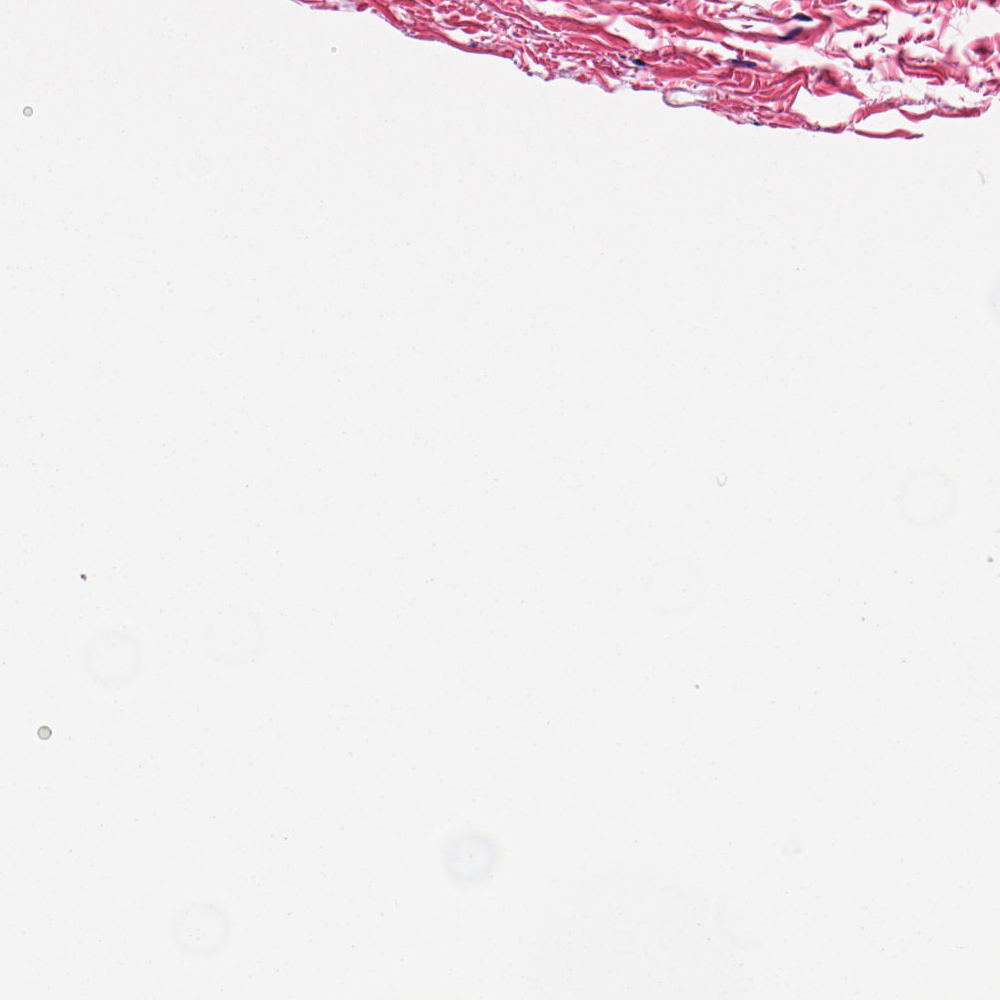

In [109]:
osl.read_region((bbox_coordinates_lvl.x_ul, bbox_coordinates_lvl.y_ul), 0, (1000,1000))

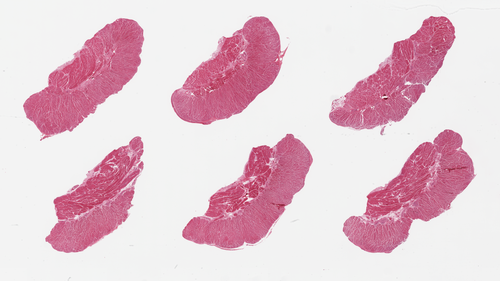

In [105]:
osl.get_thumbnail((500,500))

In [110]:
def get_biggest_tissue_region(path, pre_mask=BiggestTissueBoxMask()):
    
    slide = Slide(path, processed_path=process_path)
    mask=pre_mask(slide)
    levelbbox=CoordinatePair(*regions_from_binary_mask(mask)[0].bbox)
    bbox_coordinates_lvl = scale_coordinates(levelbbox, mask.shape[::-1], slide.level_dimensions(0))
    
    return bbox_coordinates_lvl

In [111]:
df['biggest_tissue_mask_coords'] = df.paths.apply(get_biggest_tissue_region)

In [113]:
df

,paths,patient_id,tissue,cat,notes,maj_tissue,size,tokens,strp_punc,1stword,complete_tokens,h,w,biggest_tissue_mask_coords
0,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-14DAR-0426,Adipose - Visceral (Omentum),hyperplasia,"2 pieces, ~5% fasca, delineated. Minute focus ...",Adipose,"(55775, 37700)","[pieces, fasca, delineated, Minute, focus, of,...",2 pieces 5 fasca delineated Minute focus of me...,[2],"[2, pieces, fasca, delineated, Minute, focus, ...",55775,37700,"(22730, 4400, 52470, 28700)"
1,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-13QBU-0926,Esophagus - Muscularis,clean_specimens,"6 pieces, all muscularis, good specimens",Esophagus,"(71711, 40331)","[pieces, all, muscularis, good, specimens]",6 pieces all muscularis good specimens,[6],"[6, pieces, all, muscularis, good, specimens]",71711,40331,"(48675, 18113, 68906, 36928)"
2,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-18QFQ-0326,Muscle - Skeletal,atrophy,2 pieces; skeletal muscle with scant internal ...,Muscle,"(49799, 24496)","[pieces, skeletal, muscle, with, scant, intern...",2 pieces skeletal muscle with scant internal f...,[2],"[2, pieces, skeletal, muscle, with, scant, int...",49799,24496,"(2108, 4618, 20983, 21383)"
3,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-139YR-1526,Pancreas,fibrosis,"2 pieces; islets well visualized, focal PanIN-...",Pancreas,"(63743, 37311)","[pieces, islets, well, visualized, focal, PanI...",2 pieces islets well visualized focal PanIN1 s...,[2],"[2, pieces, islets, well, visualized, focal, P...",63743,37311,"(5503, 7202, 34923, 34210)"
4,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-R55C-0526,Lung,emphysema,"2 pieces, 10x7 & 8x5 mm; patchy emphysema",Lung,"(39839, 32246)","[pieces, 10x7, 8x5, mm, patchy, emphysema]",2 pieces 10x7 8x5 mm patchy emphysema,[2],"[2, pieces, 10x7, 8x5, mm, patchy, emphysema]",39839,32246,"(17617, 1402, 39138, 20228)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7723,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-1GTWX-0626,Lung,congestion,"2 pieces, moderate congestion",Lung,"(41831, 26034)","[pieces, moderate, congestion]",2 pieces moderate congestion,[2],"[2, pieces, moderate, congestion]",41831,26034,"(3002, 5206, 18813, 21427)"
7724,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-1AX8Z-2226,Stomach,gastritis,6 pieces: 2 without muscularis; chronic gastritis,Stomach,"(51791, 35651)","[pieces, without, muscularis, chronic, gastritis]",6 pieces 2 without muscularis chronic gastritis,[6],"[6, pieces, without, muscularis, chronic, gast...",51791,35651,"(20736, 17525, 33859, 30643)"
7725,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-1J8Q3-1526,Adipose - Subcutaneous,fibrosis,2 pieces; <10% fibrous content,Adipose,"(53783, 38942)","[pieces, 10, fibrous, content]",2 pieces 10 fibrous content,[2],"[2, pieces, 10, fibrous, content]",53783,38942,"(27542, 11011, 49776, 35638)"
7726,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-UJHI-0126,Spleen,congestion,"2 pieces, 8x7 & 8x7mm; moderate congestion; di...",Spleen,"(45815, 32790)","[pieces, 8x7, 8x7mm, moderate, congestion, dis...",2 pieces 8x7 8x7mm moderate congestion discre...,[2],"[2, pieces, 8x7, 8x7mm, moderate, congestion, ...",45815,32790,"(23158, 12233, 45313, 30583)"


In [116]:
df.to_pickle('biggest_tissue_mask.pkl')

In [117]:
df

,paths,patient_id,tissue,cat,notes,maj_tissue,size,tokens,strp_punc,1stword,complete_tokens,h,w,biggest_tissue_mask_coords
0,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-14DAR-0426,Adipose - Visceral (Omentum),hyperplasia,"2 pieces, ~5% fasca, delineated. Minute focus ...",Adipose,"(55775, 37700)","[pieces, fasca, delineated, Minute, focus, of,...",2 pieces 5 fasca delineated Minute focus of me...,[2],"[2, pieces, fasca, delineated, Minute, focus, ...",55775,37700,"(22730, 4400, 52470, 28700)"
1,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-13QBU-0926,Esophagus - Muscularis,clean_specimens,"6 pieces, all muscularis, good specimens",Esophagus,"(71711, 40331)","[pieces, all, muscularis, good, specimens]",6 pieces all muscularis good specimens,[6],"[6, pieces, all, muscularis, good, specimens]",71711,40331,"(48675, 18113, 68906, 36928)"
2,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-18QFQ-0326,Muscle - Skeletal,atrophy,2 pieces; skeletal muscle with scant internal ...,Muscle,"(49799, 24496)","[pieces, skeletal, muscle, with, scant, intern...",2 pieces skeletal muscle with scant internal f...,[2],"[2, pieces, skeletal, muscle, with, scant, int...",49799,24496,"(2108, 4618, 20983, 21383)"
3,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-139YR-1526,Pancreas,fibrosis,"2 pieces; islets well visualized, focal PanIN-...",Pancreas,"(63743, 37311)","[pieces, islets, well, visualized, focal, PanI...",2 pieces islets well visualized focal PanIN1 s...,[2],"[2, pieces, islets, well, visualized, focal, P...",63743,37311,"(5503, 7202, 34923, 34210)"
4,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-R55C-0526,Lung,emphysema,"2 pieces, 10x7 & 8x5 mm; patchy emphysema",Lung,"(39839, 32246)","[pieces, 10x7, 8x5, mm, patchy, emphysema]",2 pieces 10x7 8x5 mm patchy emphysema,[2],"[2, pieces, 10x7, 8x5, mm, patchy, emphysema]",39839,32246,"(17617, 1402, 39138, 20228)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7723,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-1GTWX-0626,Lung,congestion,"2 pieces, moderate congestion",Lung,"(41831, 26034)","[pieces, moderate, congestion]",2 pieces moderate congestion,[2],"[2, pieces, moderate, congestion]",41831,26034,"(3002, 5206, 18813, 21427)"
7724,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-1AX8Z-2226,Stomach,gastritis,6 pieces: 2 without muscularis; chronic gastritis,Stomach,"(51791, 35651)","[pieces, without, muscularis, chronic, gastritis]",6 pieces 2 without muscularis chronic gastritis,[6],"[6, pieces, without, muscularis, chronic, gast...",51791,35651,"(20736, 17525, 33859, 30643)"
7725,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-1J8Q3-1526,Adipose - Subcutaneous,fibrosis,2 pieces; <10% fibrous content,Adipose,"(53783, 38942)","[pieces, 10, fibrous, content]",2 pieces 10 fibrous content,[2],"[2, pieces, 10, fibrous, content]",53783,38942,"(27542, 11011, 49776, 35638)"
7726,/project/GutIntelligenceLab/ss4yd/gtex_data/ac...,GTEX-UJHI-0126,Spleen,congestion,"2 pieces, 8x7 & 8x7mm; moderate congestion; di...",Spleen,"(45815, 32790)","[pieces, 8x7, 8x7mm, moderate, congestion, dis...",2 pieces 8x7 8x7mm moderate congestion discre...,[2],"[2, pieces, 8x7, 8x7mm, moderate, congestion, ...",45815,32790,"(23158, 12233, 45313, 30583)"
